In [6]:
import os
import wfdb
import numpy as np
from scipy.signal import butter, filtfilt

# Define the path where your MIT-BIH dataset is stored
data_path = '/home/researchgroup/mahjabeen_workspace/research/CLINet-ECG-Classification-2024/data/mit-bih/mitbih_database/'

# Define the path where you want to save the processed signals
processed_data_path = './save_processed_signals'
os.makedirs(processed_data_path, exist_ok=True)

# List of all records in the dataset
record_list = ['100', '101', '103', '105', '106', '108', '109', '111', '112', '113',
               '114', '115', '116', '117', '118', '119', '121', '122', '123', '124',
               '200', '201', '202', '203', '205', '207', '208', '209', '210', '212',
               '213', '214', '215', '219', '220', '221', '222', '223', '228', '230',
               '231', '232', '233', '234']

# Sort the record list to ensure ascending order
record_list.sort()

# Function to apply bandpass filter
def bandpass_filter(signal, lowcut=0.5, highcut=50.0, fs=360, order=5):
    nyquist = 0.5 * fs
    low = lowcut / nyquist
    high = highcut / nyquist
    b, a = butter(order, [low, high], btype='band')
    return filtfilt(b, a, signal)

# Iterate over all records
for record_name in record_list:
    print(f'Processing record: {record_name}')
    
    # Load record and annotations
    record = wfdb.rdrecord(os.path.join(data_path, record_name))
    annotation = wfdb.rdann(os.path.join(data_path, record_name), 'atr')
    
    # Get the ECG signal and apply bandpass filter
    ecg_signal = record.p_signal[:, 0]  # Use lead II (usually the first channel)
    filtered_signal = bandpass_filter(ecg_signal)
    
    # Save the filtered signal
    filtered_signal_path = os.path.join(processed_data_path, f'{record_name}_filtered.npy')
    np.save(filtered_signal_path, filtered_signal)
    print(f'Saved filtered signal to {filtered_signal_path}')
    
    # Save annotations if needed
    annotations_path = os.path.join(processed_data_path, f'{record_name}_annotations.npy')
    np.save(annotations_path, annotation.sample)
    print(f'Saved annotations to {annotations_path}')

print('Processing complete!')


Processing record: 100
Saved filtered signal to ./save_processed_signals/100_filtered.npy
Saved annotations to ./save_processed_signals/100_annotations.npy
Processing record: 101
Saved filtered signal to ./save_processed_signals/101_filtered.npy
Saved annotations to ./save_processed_signals/101_annotations.npy
Processing record: 103
Saved filtered signal to ./save_processed_signals/103_filtered.npy
Saved annotations to ./save_processed_signals/103_annotations.npy
Processing record: 105
Saved filtered signal to ./save_processed_signals/105_filtered.npy
Saved annotations to ./save_processed_signals/105_annotations.npy
Processing record: 106
Saved filtered signal to ./save_processed_signals/106_filtered.npy
Saved annotations to ./save_processed_signals/106_annotations.npy
Processing record: 108
Saved filtered signal to ./save_processed_signals/108_filtered.npy
Saved annotations to ./save_processed_signals/108_annotations.npy
Processing record: 109
Saved filtered signal to ./save_processed

In [7]:
import os
import wfdb
import numpy as np
from scipy.signal import resample

# Define paths
filtered_data_path = './save_processed_signals'
data_path = '/home/researchgroup/mahjabeen_workspace/research/CLINet-ECG-Classification-2024/data/mit-bih/mitbih_database/'
segments_dir = './heartbeat_segments'
labels_dir = './heartbeat_labels'

# Create directories if they don't exist
os.makedirs(segments_dir, exist_ok=True)
os.makedirs(labels_dir, exist_ok=True)

# Define class mappings based on AAMI standard
class_map = {
    'N': 'normal', 'L': 'normal', 'R': 'normal', 'e': 'normal', 'j': 'normal',
    'A': 'SVEB', 'a': 'SVEB', 'J': 'SVEB', 'S': 'SVEB',
    'V': 'VEB', 'E': 'VEB',
    'F': 'fusion',
    'Q': 'unknown', '/': 'unknown', 'f': 'unknown'
}

# Function to extract heartbeats and labels
def extract_heartbeats_and_labels(record_name, filtered_data_path, data_path, segments_dir, labels_dir):
    print(f"Processing record: {record_name}")
    
    # Load the filtered ECG signal
    signal_path = os.path.join(filtered_data_path, f"{record_name}_filtered.npy")
    ecg_signal = np.load(signal_path)
    
    # Load annotations
    annotation = wfdb.rdann(os.path.join(data_path, record_name), 'atr')
    r_peaks = annotation.sample
    labels = annotation.symbol
    
    # Sampling rate of the original data
    original_fs = 360
    
    # Target sampling rate
    target_fs = 224
    
    # Extract heartbeat segments and labels
    heartbeats = []
    heartbeat_labels = []
    for peak, label in zip(r_peaks, labels):
        if label in class_map:
            start_idx = max(0, peak - 144)
            end_idx = min(len(ecg_signal), peak + 180)
            
            if end_idx - start_idx == 324:
                heartbeat_segment = ecg_signal[start_idx:end_idx]
                # Resample to target sampling rate
                resampled_segment = resample(heartbeat_segment, int(len(heartbeat_segment) * target_fs / original_fs))
                heartbeats.append(resampled_segment)
                heartbeat_labels.append(class_map[label])
    
    # Save the resampled heartbeats and labels
    heartbeats = np.array(heartbeats)
    heartbeat_labels = np.array(heartbeat_labels)
    heartbeats_file_path = os.path.join(segments_dir, f"{record_name}_heartbeats.npy")
    labels_file_path = os.path.join(labels_dir, f"{record_name}_labels.npy")
    np.save(heartbeats_file_path, heartbeats)
    np.save(labels_file_path, heartbeat_labels)
    print(f"Saved heartbeats to {heartbeats_file_path}")
    print(f"Saved labels to {labels_file_path}")

# List of records to process
record_list = ['100', '101', '103', '105', '106', '108', '109', '111', '112', '113',
               '114', '115', '116', '117', '118', '119', '121', '122', '123', '124',
               '200', '201', '202', '203', '205', '207', '208', '209', '210', '212',
               '213', '214', '215', '219', '220', '221', '222', '223', '228', '230',
               '231', '232', '233', '234']

# Sort the record list to ensure ascending order
record_list.sort()

# Process each record
for record in record_list:
    extract_heartbeats_and_labels(record, filtered_data_path, data_path, segments_dir, labels_dir)

print('Heartbeat extraction and label saving complete!')


Processing record: 100
Saved heartbeats to ./heartbeat_segments/100_heartbeats.npy
Saved labels to ./heartbeat_labels/100_labels.npy
Processing record: 101
Saved heartbeats to ./heartbeat_segments/101_heartbeats.npy
Saved labels to ./heartbeat_labels/101_labels.npy
Processing record: 103
Saved heartbeats to ./heartbeat_segments/103_heartbeats.npy
Saved labels to ./heartbeat_labels/103_labels.npy
Processing record: 105
Saved heartbeats to ./heartbeat_segments/105_heartbeats.npy
Saved labels to ./heartbeat_labels/105_labels.npy
Processing record: 106
Saved heartbeats to ./heartbeat_segments/106_heartbeats.npy
Saved labels to ./heartbeat_labels/106_labels.npy
Processing record: 108
Saved heartbeats to ./heartbeat_segments/108_heartbeats.npy
Saved labels to ./heartbeat_labels/108_labels.npy
Processing record: 109
Saved heartbeats to ./heartbeat_segments/109_heartbeats.npy
Saved labels to ./heartbeat_labels/109_labels.npy
Processing record: 111
Saved heartbeats to ./heartbeat_segments/111_h

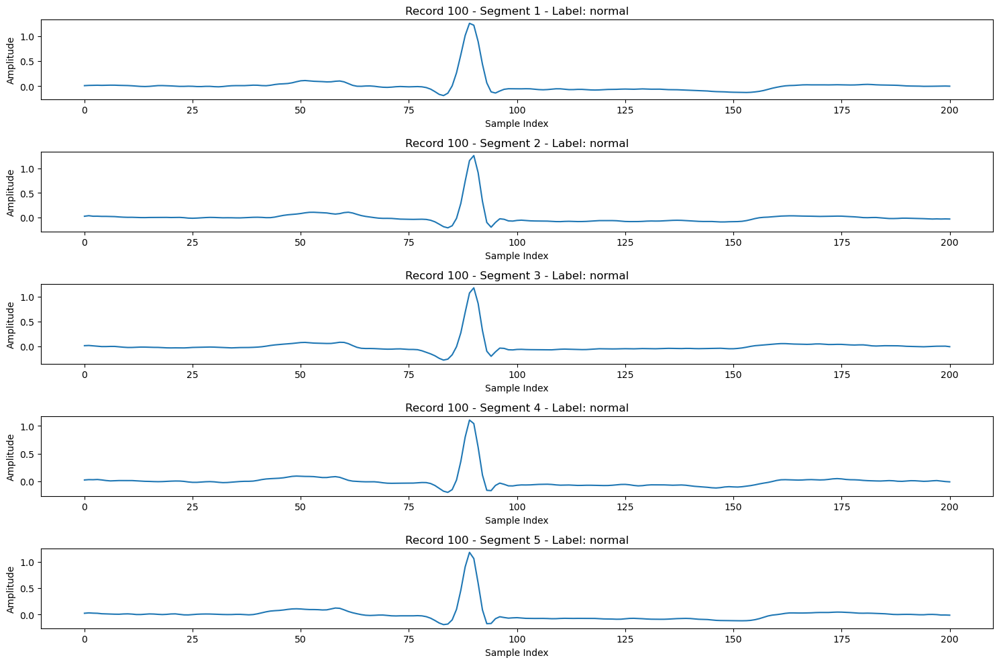

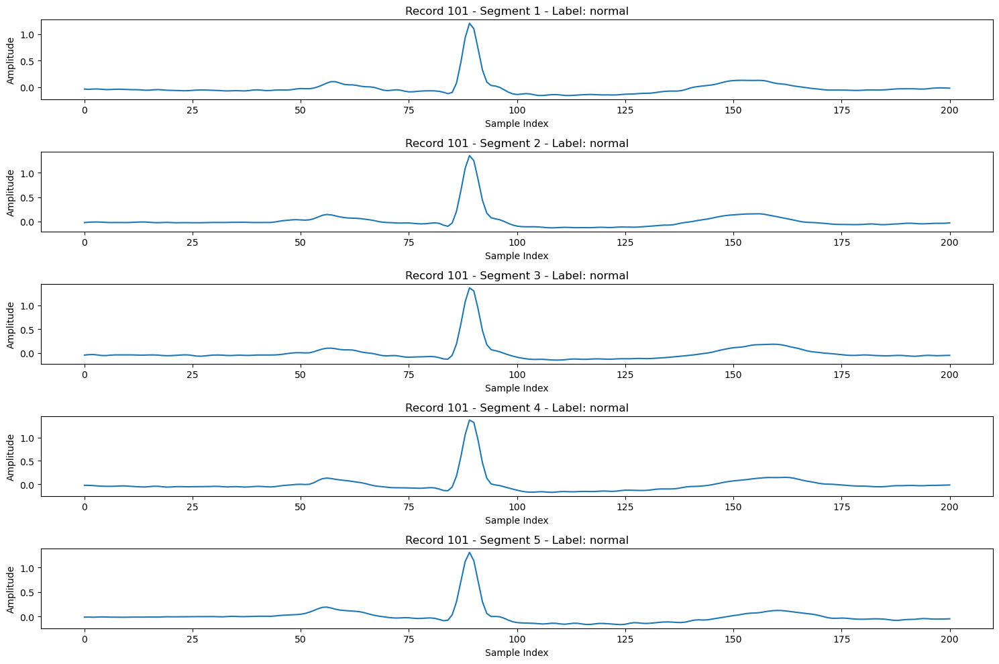

In [8]:
import os
import numpy as np
import matplotlib.pyplot as plt

# Define paths
segments_dir = './heartbeat_segments'
labels_dir = './heartbeat_labels'

# Function to visualize ECG segments
def visualize_segments(record_name, num_segments=5):
    # Load segments and labels
    segments_path = os.path.join(segments_dir, f'{record_name}_heartbeats.npy')
    labels_path = os.path.join(labels_dir, f'{record_name}_labels.npy')
    
    if not os.path.exists(segments_path) or not os.path.exists(labels_path):
        print(f"Data for record {record_name} not found.")
        return
    
    segments = np.load(segments_path)
    labels = np.load(labels_path)
    
    # Plot a few segments
    num_segments = min(num_segments, len(segments))  # Limit the number of segments to available data
    plt.figure(figsize=(15, num_segments * 2))
    
    for i in range(num_segments):
        plt.subplot(num_segments, 1, i+1)
        plt.plot(segments[i])
        plt.title(f'Record {record_name} - Segment {i+1} - Label: {labels[i]}')
        plt.xlabel('Sample Index')
        plt.ylabel('Amplitude')
    
    plt.tight_layout()
    plt.show()

# Records to visualize
record_names = ['100', '101']  # Specify records to visualize

# Visualize segments for each record
for record in record_names:
    visualize_segments(record, num_segments=5)


In [10]:
import os
import numpy as np

# Define paths
segments_dir = './heartbeat_segments'
labels_dir = './heartbeat_labels'

# Function to count segments and labels
def count_segments_and_labels(record_name):
    # Load segments and labels
    segments_path = os.path.join(segments_dir, f'{record_name}_heartbeats.npy')
    labels_path = os.path.join(labels_dir, f'{record_name}_labels.npy')
    
    if not os.path.exists(segments_path) or not os.path.exists(labels_path):
        print(f"Data for record {record_name} not found.")
        return None, None
    
    segments = np.load(segments_path)
    labels = np.load(labels_path)
    
    # Count segments
    num_segments = len(segments)
    
    # Count labels
    unique_labels, counts = np.unique(labels, return_counts=True)
    label_counts = dict(zip(unique_labels, counts))
    
    return num_segments, label_counts


# List of records to process
record_list = ['100', '101', '103', '105', '106', '108', '109', '111', '112', '113',
               '114', '115', '116', '117', '118', '119', '121', '122', '123', '124',
               '200', '201', '202', '203', '205', '207', '208', '209', '210', '212',
               '213', '214', '215', '219', '220', '221', '222', '223', '228', '230',
               '231', '232', '233', '234']

# Print the count for each record
for record in record_list:
    num_segments, label_counts = count_segments_and_labels(record)
    if num_segments is not None and label_counts is not None:
        print(f"Record {record}:")
        print(f"  Total Segments: {num_segments}")
        print(f"  Label Counts: {label_counts}")
    print()


Record 100:
  Total Segments: 2271
  Label Counts: {'SVEB': 33, 'VEB': 1, 'normal': 2237}

Record 101:
  Total Segments: 1864
  Label Counts: {'SVEB': 3, 'normal': 1859, 'unknown': 2}

Record 103:
  Total Segments: 2083
  Label Counts: {'SVEB': 2, 'normal': 2081}

Record 105:
  Total Segments: 2572
  Label Counts: {'VEB': 41, 'normal': 2526, 'unknown': 5}

Record 106:
  Total Segments: 2027
  Label Counts: {'VEB': 520, 'normal': 1507}

Record 108:
  Total Segments: 1762
  Label Counts: {'SVEB': 4, 'VEB': 17, 'fusion': 2, 'normal': 1739}

Record 109:
  Total Segments: 2530
  Label Counts: {'VEB': 38, 'fusion': 2, 'normal': 2490}

Record 111:
  Total Segments: 2124
  Label Counts: {'VEB': 1, 'normal': 2123}

Record 112:
  Total Segments: 2537
  Label Counts: {'SVEB': 2, 'normal': 2535}

Record 113:
  Total Segments: 1794
  Label Counts: {'SVEB': 6, 'normal': 1788}

Record 114:
  Total Segments: 1879
  Label Counts: {'SVEB': 12, 'VEB': 43, 'fusion': 4, 'normal': 1820}

Record 115:
  Total

In [11]:
#Image Transformation
import os
import numpy as np
import matplotlib.pyplot as plt
from pyts.image import RecurrencePlot, GramianAngularField, MarkovTransitionField

# Define paths
segments_dir = './heartbeat_segments'
labels_dir = './heartbeat_labels'
output_dir = './transformed_images'
os.makedirs(output_dir, exist_ok=True)

# Create directories for each transformation method
rp_dir = os.path.join(output_dir, 'RP')
gaf_dir = os.path.join(output_dir, 'GAF')
mtf_dir = os.path.join(output_dir, 'MTF')

os.makedirs(rp_dir, exist_ok=True)
os.makedirs(gaf_dir, exist_ok=True)
os.makedirs(mtf_dir, exist_ok=True)

# Function to transform and save images
def transform_and_save_images(segments_dir, labels_dir, rp_dir, gaf_dir, mtf_dir):
    segment_files = [f for f in os.listdir(segments_dir) if f.endswith('_heartbeats.npy')]
    
    for file in segment_files:
        record_name = file.split('_heartbeats.npy')[0]
        print(f"Processing {record_name}")
        
        # Load the heartbeats and labels
        segments_path = os.path.join(segments_dir, file)
        segments = np.load(segments_path)
        labels_path = os.path.join(labels_dir, f"{record_name}_labels.npy")
        labels = np.load(labels_path)
        
        for i, segment in enumerate(segments):
            label = labels[i]
            
            # Recurrence Plot (RP)
            rp_transformer = RecurrencePlot(threshold='point', percentage=20)
            rp_image = rp_transformer.fit_transform([segment])[0]
            rp_image_path = os.path.join(rp_dir, f'{record_name}_{i}_{label}_RP.png')
            plt.imsave(rp_image_path, rp_image, cmap='gray')
            
            # Gramian Angular Field (GAF)
            gaf_transformer = GramianAngularField(method='summation')
            gaf_image = gaf_transformer.fit_transform([segment])[0]
            gaf_image_path = os.path.join(gaf_dir, f'{record_name}_{i}_{label}_GAF.png')
            plt.imsave(gaf_image_path, gaf_image, cmap='rainbow')
            
            # Markov Transition Field (MTF)
            mtf_transformer = MarkovTransitionField(n_bins=10)
            mtf_image = mtf_transformer.fit_transform([segment])[0]
            mtf_image_path = os.path.join(mtf_dir, f'{record_name}_{i}_{label}_MTF.png')
            plt.imsave(mtf_image_path, mtf_image, cmap='viridis')
            
            print(f"Saved images for segment {i} with label {label}")

# Execute the transformation and saving function
transform_and_save_images(segments_dir, labels_dir, rp_dir, gaf_dir, mtf_dir)

print('Image transformation complete!')


Processing 100
Saved images for segment 0 with label normal
Saved images for segment 1 with label normal
Saved images for segment 2 with label normal
Saved images for segment 3 with label normal
Saved images for segment 4 with label normal
Saved images for segment 5 with label normal
Saved images for segment 6 with label SVEB
Saved images for segment 7 with label normal
Saved images for segment 8 with label normal
Saved images for segment 9 with label normal
Saved images for segment 10 with label normal
Saved images for segment 11 with label normal
Saved images for segment 12 with label normal
Saved images for segment 13 with label normal
Saved images for segment 14 with label normal
Saved images for segment 15 with label normal
Saved images for segment 16 with label normal
Saved images for segment 17 with label normal
Saved images for segment 18 with label normal
Saved images for segment 19 with label normal
Saved images for segment 20 with label normal
Saved images for segment 21 wit

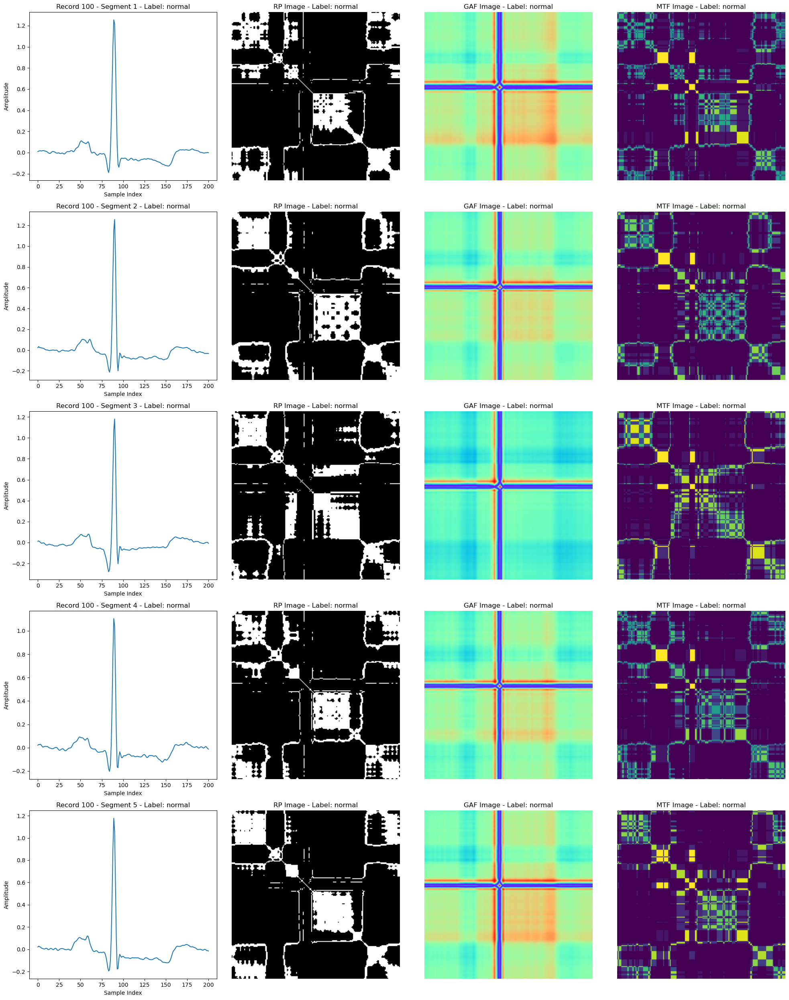

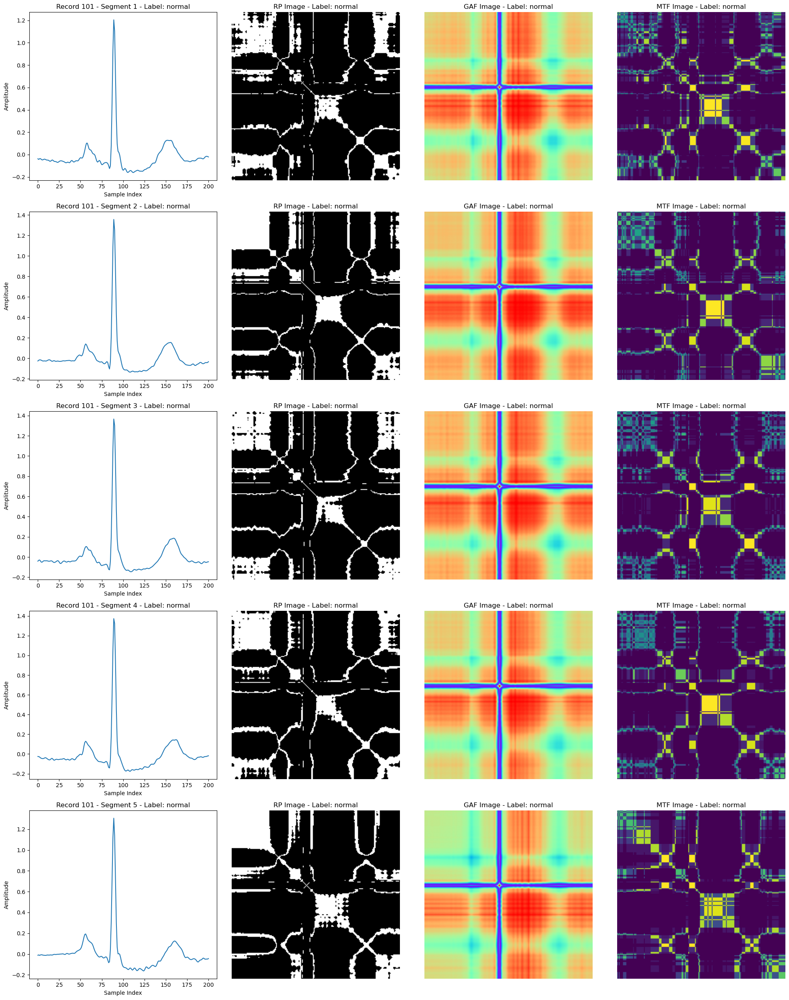

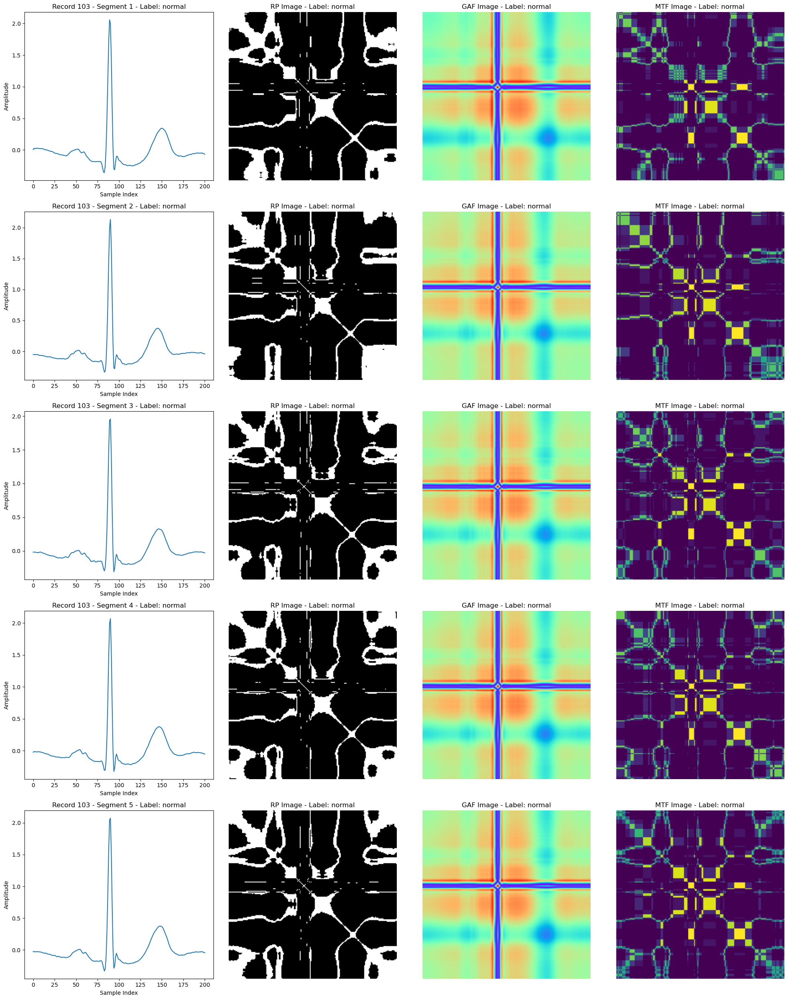

In [12]:
import os
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

# Define paths
segments_dir = './heartbeat_segments'
labels_dir = './heartbeat_labels'
rp_dir = './transformed_images/RP'
gaf_dir = './transformed_images/GAF'
mtf_dir = './transformed_images/MTF'

# Function to visualize segments and images
def visualize_segments_and_images(record_name, num_segments=5):
    # Load segments and labels
    segments_path = os.path.join(segments_dir, f'{record_name}_heartbeats.npy')
    labels_path = os.path.join(labels_dir, f'{record_name}_labels.npy')
    
    if not os.path.exists(segments_path) or not os.path.exists(labels_path):
        print(f"Data for record {record_name} not found.")
        return
    
    segments = np.load(segments_path)
    labels = np.load(labels_path)
    
    # Limit the number of segments to display
    num_segments = min(num_segments, len(segments))
    
    plt.figure(figsize=(20, num_segments * 5))
    
    for i in range(num_segments):
        segment = segments[i]
        label = labels[i]
        
        # Load images
        rp_image_path = os.path.join(rp_dir, f'{record_name}_{i}_{label}_RP.png')
        gaf_image_path = os.path.join(gaf_dir, f'{record_name}_{i}_{label}_GAF.png')
        mtf_image_path = os.path.join(mtf_dir, f'{record_name}_{i}_{label}_MTF.png')
        
        rp_image = np.array(Image.open(rp_image_path))
        gaf_image = np.array(Image.open(gaf_image_path))
        mtf_image = np.array(Image.open(mtf_image_path))
        
        # Plot original segment
        plt.subplot(num_segments, 4, i * 4 + 1)
        plt.plot(segment)
        plt.title(f'Record {record_name} - Segment {i+1} - Label: {label}')
        plt.xlabel('Sample Index')
        plt.ylabel('Amplitude')
        
        # Plot RP image
        plt.subplot(num_segments, 4, i * 4 + 2)
        plt.imshow(rp_image, cmap='gray')
        plt.title(f'RP Image - Label: {label}')
        plt.axis('off')
        
        # Plot GAF image
        plt.subplot(num_segments, 4, i * 4 + 3)
        plt.imshow(gaf_image, cmap='rainbow')
        plt.title(f'GAF Image - Label: {label}')
        plt.axis('off')
        
        # Plot MTF image
        plt.subplot(num_segments, 4, i * 4 + 4)
        plt.imshow(mtf_image, cmap='viridis')
        plt.title(f'MTF Image - Label: {label}')
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

# Records to visualize
record_names = ['100', '101', '103']  # Specify records to visualize

# Visualize segments and images for each record
for record in record_names:
    visualize_segments_and_images(record, num_segments=5)
